# 02805 week5 exercise
s202997 Nina Weng

## Part A: Let's visualise!
### Exercise 1: Build the right graph for visualization.

> We will continue to work with the network from last week, see the lecture for Week 4 for details. This is important! Actually, in order to continue with the lecture, you need to complete Week 4:
> 1. Use NetworkX DiGraph to store the network of characters. Remember that characters are linked if they have a corresponding link between their Wikipedia contents.
>>Additionally, extract the largest component - it will make our work with visualisations much easier (note: removing isolated nodes (with no links) does not guarantee that you are left with the largest component).  
>>Note 1: You probably have the right graph if you have more than 2k nodes and more than 15k edges.  
>>Note 2: For directed graphs use weakly connected component to extract the largest component.  
>>Note 3: Further analysis is done with the largest component  


In [1]:
# as some wiki links contains symbols like ':' and '/' which is not allowed in file name
# then we use a function to replace those symbols when necessary

# get the name for file saving and reading
def file_saving_reading_name(s):
    s = s.replace(':','@')
    s = s.replace('/','$')
    return s

# get the name with ':' and '/'
def node_name(s):
    s = s.replace('@',':')
    s = s.replace('$','/')
    return s

In [2]:
# get the DiGraph which store the relationships of comics characters

# load the nodes and edges from pre-dumped json file
import json
file_path = './data/comics_cha.json'
with open(file_path, 'r') as f:
    data = json.load(f)

In [3]:
import networkx as nx

# bulid the network from data 
G = nx.DiGraph()

# get the attribute from comics_cha
attr_dict = {}
for each in data:
    attr_dict[each] = data[each]['type']

# add nodes    
G.add_nodes_from(data.keys())
# add attribute of type
nx.set_node_attributes(G, attr_dict,'type')


# add links
for each in data:
    for link in data[each]['edges']:
        G.add_edge(each,link)
        
print('number of nodes in network:{}'.format(len(G.nodes())))
print('number of links in network:{}'.format(len(G.edges())))

number of nodes in network:2277
number of links in network:33461


In [4]:
# extract the largest component 
largest_cc = max(nx.weakly_connected_components(G), key=len)
print('Number of nodes in the largest component:{}'.format(len(largest_cc)))
GCC = G.subgraph(largest_cc)
print('Number of links in the largest component:{}'.format(len(GCC.edges())))

Number of nodes in the largest component:2131
Number of links in the largest component:33461


> 2. As you build the graph, store the attributes of the nodes (remember the universe from the past week). On top of that, let's also store the length of the content as one of the attributes of the node (i.e. count the number of words you have in each character's page). By storing this information as nodal features, we keep all the relevant data in one place. The safe way to count words without counting symbols is to use regex, but simpler methods are OK.

In [5]:
import re
# prepare the new attribute: the length of content for each node
attr_dict = {}

# for each node
for node_name in G.nodes():
    # first, get the json file of that node which contains the wikipage of that
    
    
    json_path = './data/'+nx.get_node_attributes(G,'type')[node_name]+'/'+file_saving_reading_name(node_name)+'.json'
    with open(json_path,'r') as f:
        content = json.load(f)
    
    # remove special symbols
    c = re.sub(r'[^a-zA-Z0-9-]+',' ',content)
    
    # calculate the number of works (removing the symbols)
    attr_dict[node_name] = len(c)

# add the attribute(the length of contents) to the network
nx.set_node_attributes(G, attr_dict,'len_content')

In [6]:
# print the nodes with the maximum and minimum content length 
len_sorted = sorted(G.nodes, key=lambda item:nx.get_node_attributes(G,'len_content')[item], reverse=True)
print('The maximum of the content length:{}({})\nThe minimum of the content length:{}({})'.format(len_sorted[0],\
    nx.get_node_attributes(G,'len_content')[len_sorted[0]],len_sorted[-1],nx.get_node_attributes(G,'len_content')[len_sorted[-1]]))

The maximum of the content length:Wonder_Woman(182474)
The minimum of the content length:Lesla-Lar(59)


### Exercise 2: Let's build a simple visualization of network

> 1. For the sake of the visualisation, let's convert our network to undirected graph (tip: There is a NetworkX command to help you).  
> Note: Keep the directed graph, we will use it in couple of the following exercises

In [6]:
# convert the network to undirected, use the GCC as the previous exercise suggests 'it will make our work with visualisations much easier'
G_undirect = GCC.to_undirected()

# get the number of nodes and edges of the new network
print('Number of nodes:{}'.format(len(G_undirect.nodes())))
print('Number of edges:{}'.format(len(G_undirect.edges())))

Number of nodes:2131
Number of edges:27433


> 2. Use the NetworkX command nx.draw_kamada_kawai to draw the network resulting undirected. (You can find background on the algorithm here.)
    >> * Node color should depend on the universe attribute (i.e. use different colors for DC and Marvel universe)
    >> * Set up your plot so that node-size depends on the node degree
    >> * Optional: Set up you plot so that edge color depends on the universe attribute. If an edge connects two nodes from Marvel universe assign color_a, if the edge connects two nodes from DC universe assign color_b, in case a link connects nodes from disparate universes, cases assign color_c. (Here, you get to decide on the colors.)

In [7]:
import matplotlib.pyplot as plt
from itertools import count


# get the dict of degree in G undirected 
d = dict(G_undirect.degree)

# color map for nodes
color_map_nodes = []
for node in list(G_undirect.nodes()):
    if nx.get_node_attributes(G_undirect,'type')[node] == 'Marvel':
        color_map_nodes.append("#DC143C")
    else: # DC
        color_map_nodes.append("#4169E1")



# color map for egdes
color_map_edge = []
color_a,color_b,color_c = '#FFB6C1', '#87CEFA'  ,'#9932CC'# for marvel-marvel, dc-dc, and marvel-dc respectively
for e in list(G_undirect.edges()):
    if nx.get_node_attributes(G_undirect, 'type')[e[0]] != nx.get_node_attributes(G_undirect, 'type')[e[1]]:
        color_map_edge.append(color_c)
    elif nx.get_node_attributes(G_undirect, 'type')[e[0]] == 'Marvel':
        color_map_edge.append(color_a)
    else:
        color_map_edge.append(color_b)
        


<Figure size 2160x1440 with 0 Axes>

2131
27433
It will need sometime to plot, please be patient...


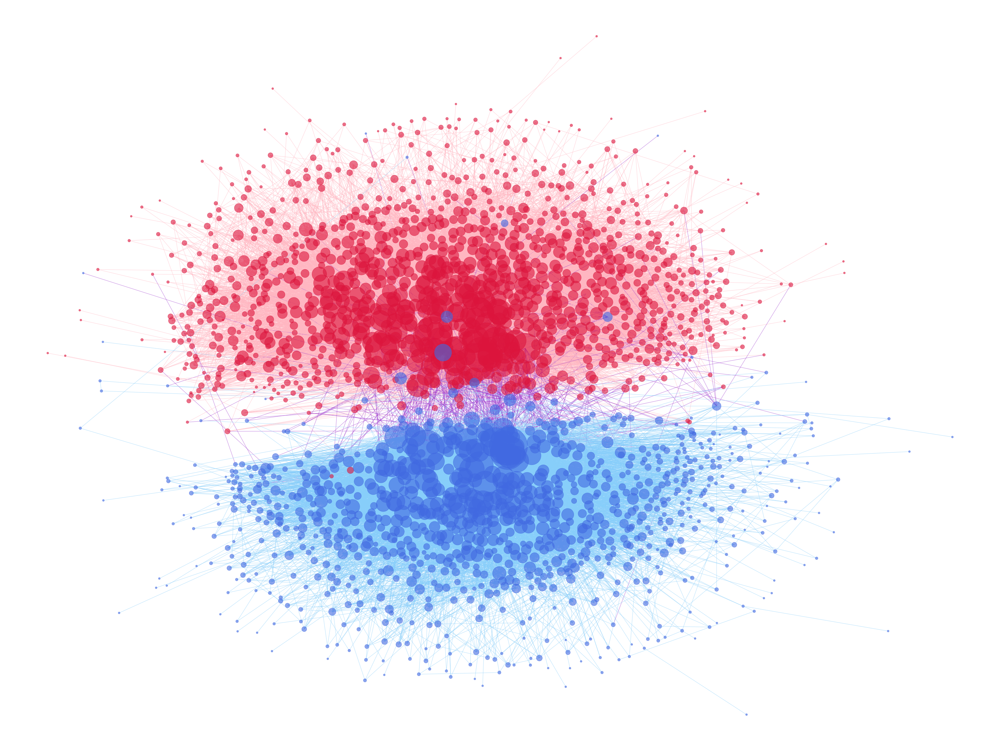

In [12]:
print(len(color_map_nodes))
print(len(color_map_edge))
print('It will need sometime to plot, please be patient...')

# visualize with draw_kamada_kawai
plt.figure(figsize=(40,30))
nx.draw_kamada_kawai(G_undirect,nodelist=d.keys(), node_size=[v * 30 for v in d.values()], node_color = color_map_nodes,alpha = 0.6,\
                    edge_color = color_map_edge)
plt.show()

### Exercise 3: We can make even better visualisations with ForceAtlas2 package

> - The Force Atlas 2 algorithm helps calculate more aesthetically pleasing positions for the nodes (see what the result looks like below).   
> - You can install the package typing pip install fa2 in the terminal. The github page explains how to use the package to get coordinates for each node.

> - Visualize the network using the Networkx draw function, and node-coordinates from the force atlas algorithm. As in the previous Exercise:
>> Node color should depend on the universe attribute (i.e. use different colors for DC and Marvel universe)  
>> Node size should depend on the node degree  
>> Optional: Edge colour should depend on the universe attribute. If an edge connects nodes from Marvel universe assign color_a, if the edge connects nodes from DC universe assign color_b, in other cases assign color_c  
> - Play with the force atlas algorithm parameters to obtain a visualization you like. It may look similar to the one below (but not necessarily).

100%|██████████████████████████████████████████████████████████████████████████████| 2000/2000 [03:28<00:00,  9.61it/s]


BarnesHut Approximation  took  24.99  seconds
Repulsion forces  took  174.71  seconds
Gravitational forces  took  0.73  seconds
Attraction forces  took  1.22  seconds
AdjustSpeedAndApplyForces step  took  2.61  seconds


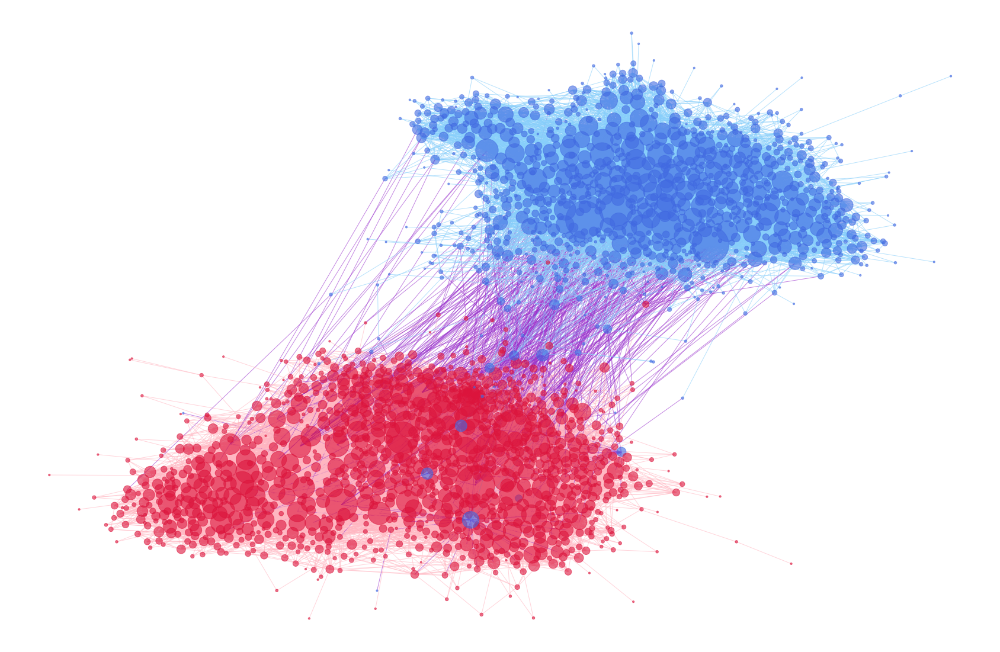

In [9]:

from fa2 import ForceAtlas2
plt.figure(figsize = (30,20))

forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=False,
                        gravity=10.0,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G_undirect, pos=None, iterations=2000)
nx.draw_networkx(G_undirect, positions,nodelist=d.keys(), node_size=[v * 10 for v in d.values()], node_color = color_map_nodes,alpha = 0.6,\
                    edge_color = color_map_edge,with_labels=False)
plt.axis('off')
plt.show()

> - Describe the structure you observe. Can you see that the nodes seperate into two separate clusters? Can you see high-degree nodes? In the plot below, the red nodes seem to split into two sub-clusters: What's going on there?

**Answer:**  
From the plot above, it is clear that the nodes are separated into 2 clusters,and high-degree nodes are obvious as they have large size. The two sub-clusters indicates that inside the Marvel group, there are 2 groups in which the relationships inside are much more stronger than outside. They might represents the 2 groups of characters blablabla, (not familar with marvel)

### Exercise 4: We continue with a qualitative inspection of the Wikipedia pages, that will help us to intepret our results. We investigate the reasons for links between characters to exist on Wikipedia.

> 1. Consider the nodes with highest in-degree in the network. Open the corresponding Wikipedia page.
>> * Consider the set of neighbours pointing towards the node found above.
>> * What is the relation between the characters you identified and his/her network neighbours? (e.g. do they appear in the same comics, are they opponents...). You don't need to come up with a grand theory of comics here, I just want you to think about how links com about.
>> * Repeat the exercise for the largest out-degree node.
>> * Are there differences between reasons for out- and in-links? Again, there's no right answer here. I just want you to think about some of the reasons why links may occur in Wikipedia


In [13]:
# get the node with largest in-degree
in_degrees = [(n,d) for n,d in G.in_degree()]
in_degrees.sort(key=lambda x: x[1],reverse= True)
print('The node with the highest in-degree in the network:{}'.format(in_degrees[0]))

The node with the highest in-degree in the network:('Spider-Man', 431)


In [14]:
# get the set of neighbours who pointing towards this node
largest_indegree_node = in_degrees[0][0]

in_neighbours = []
for e in G.edges():
    if e[1] == largest_indegree_node:
        in_neighbours.append(e[0])

print('The in-neighbours of {} are:\n'.format(largest_indegree_node))
print(in_neighbours)

The in-neighbours of Spider-Man are:

['A-Next', 'Abomination_(comics)', 'Advanced_Idea_Mechanics', 'Anne_Weying', 'Arnim_Zola', 'Baron_Brimstone', 'Batroc_the_Leaper', 'Battlestar_(comics)', 'Batwing_(Marvel_Comics)', 'Beast_(comics)', 'Beetle_(comics)', 'Beta_Ray_Bill', 'Betty_Brant', 'Beyonder', 'Big_Man_(comics)', 'Big_Wheel_(comics)', 'Bishop_(comics)', 'Blackheart', 'Black_Bolt', 'Black_Cat_(Marvel_Comics)', 'Black_Crow_(comics)', 'Black_Marvel', 'Black_Spectre', 'Black_Tom_Cassidy', 'Blade_(character)', 'Blindspot_(comics)', 'Blizzard_(comics)', 'Blob_(comics)', 'Blonde_Phantom', 'Bloodscream', 'Bloodshed_(comics)', 'Blue_Shield_(comics)', 'Bombshell_(Marvel_Comics)', 'Boomerang_(comics)', 'Brothers_Grimm_(comics)', 'Brother_Voodoo', 'Bulldozer_(comics)', 'Bullseye_(character)', 'Burglar_(comics)', 'Cable_(character)', 'Calypso_(comics)', 'Captain_America', 'Captain_America_(William_Burnside)', 'Captain_Britain', 'Captain_Universe', 'Cardiac_(comics)', 'Carlie_Cooper', 'Carnage_


> the relation between the characters you identified and his/her network neighbours?

**Answers:**
Apparently, most of those characters in in-neighbours are showed in the comics book Spider-Man. Since spider-man himself is the main character of this book, it is natural that he got connections with most of the other characters in this book. Also, as spider-man was first appearred in Amazing Fantasy, some characters from there also showed in this list.

In [15]:
# get the node with largest out-degree
out_degrees = [(n,d) for n,d in G.out_degree()]
out_degrees.sort(key=lambda x: x[1],reverse= True)
print('The node with the highest out-degree in the network:{}'.format(out_degrees[0]))

The node with the highest out-degree in the network:('Hood_(comics)', 126)


In [16]:
# get the set of neighbours who pointing from this node to others
largest_outdegree_node = out_degrees[0][0]

out_neighbours = []
for e in G.edges():
    if e[0] == largest_outdegree_node:
        out_neighbours.append(e[1])

print('The out-neighbours of {} are:\n'.format(largest_outdegree_node))
print(out_neighbours)

The out-neighbours of Hood_(comics) are:

['Batroc_the_Leaper', 'Nightshade_(Marvel_Comics)', 'Loki_(comics)', 'Satana_(Marvel_Comics)', 'Rampage_(Marvel_Comics)', 'Brother_Voodoo', 'Thanos', 'Centurius', 'Diamondback_(Willis_Stryker)', 'Foolkiller', 'Owl_(Marvel_Comics)', 'Shockwave_(comics)', 'Tiger_Shark_(Marvel_Comics)', 'Speed_Demon_(comics)', 'Golem_(comics)', 'Bulldozer_(comics)', 'Piledriver_(comics)', 'Enforcers_(comics)', 'Controller_(Marvel_Comics)', 'White_Rabbit_(comics)', 'Deathlok', 'Blue_Streak_(comics)', 'Graviton_(comics)', 'Griffin_(Marvel_Comics)', 'Human_Cannonball_(Marvel_Comics)', 'Skrull', 'Thing_(comics)', 'Firebird_(Marvel_Comics)', 'Ox_(comics)', 'Uatu', 'Bushwacker_(comics)', 'Werewolf_by_Night', 'Purple_Man', 'Punisher', 'Cobra_(Marvel_Comics)', 'White_Dragon_(comics)', 'Tombstone_(comics)', 'Wong_(comics)', 'Scourge_of_the_Underworld', 'Scarecrow_(Marvel_Comics)', 'Fantastic_Four', 'Living_Laser', 'Spot_(comics)', 'Iron_Fist_(comics)', 'Enchantress_(Marvel


> the relation between the characters you identified and his/her network neighbours?

**Answers:**
Hood is a crime boss appearing in American comic books published by Marvel Comics. In his wikipage, it do not only showed the heroes who has fight with Hood, but also a long list of Members of The Hood's Crime Syndicate. This might be the reason why Hood has the most out-degree in all the nodes.

> Are there differences between reasons for out- and in-links?   

**Answers:**
Spider-man is the main character in several comics books, therefore, in the wikipage of other small characters, it is natural that it will bring up Spider-man, as he is the one who lead the story. There's probably the reason why he got so many in-neighbours.
For Hood, as he own a crime syndicate, the relationship between he and the menbers are more clustred, the coefficient clustering of this crime syndicate should be higher, thus the in-neighbours of Hood would not be that large.  

> 2. Are there any nodes with high out-degree and with few incoming connections? If yes, open WikiPages of such characters and explain what happens?
> 3. Are there any nodes with high in-degree and few outcoming connections? Again, open WikiPages of such characters and explain what happens?

In [17]:
# from the distribution of the in-degree and out-degree
# for out-degree, define > 60 as a high out-degree
#                        < 10 as a low out-degree
# for in-degree, define > 100 as a high in-degree
#                       < 20 as a low in-degree

# get nodes with high out-degree and with few incoming connections and nodes with high in-degree and few outcoming connections
high_out_low_in = []
low_out_high_in = []
for node in G.nodes():
    if G.in_degree(node) < 20 and G.out_degree(node) > 60:
        high_out_low_in.append(node)
    elif G.in_degree(node) > 100 and G.out_degree(node) < 10:
        low_out_high_in.append(node)

print('The node(s) with high out-degree and low in-degree:{}'.format(high_out_low_in))
print('The node(s) with high in-degree and low out-degree:{}'.format(low_out_high_in))

for node in high_out_low_in:
    print('{}\tin-degree:{}\tout-degree:{}'.format(node,G.in_degree(node),G.out_degree(node)))
for node in low_out_high_in:
    print('{}\tin-degree:{}\tout-degree:{}'.format(node,G.in_degree(node),G.out_degree(node)))

The node(s) with high out-degree and low in-degree:['Rogue_(Marvel_Comics)']
The node(s) with high in-degree and low out-degree:['Decimation_(comics)']
Rogue_(Marvel_Comics)	in-degree:8	out-degree:63
Decimation_(comics)	in-degree:128	out-degree:8


**Answer:**
Firstly, we difine the high or low degree with the distribution of in-degree and out-degree.
According to the distribution plot, for out-degree, define > 60 as a high out-degree,
               < 10 as a low out-degree,
for in-degree, define > 100 as a high in-degree,
               < 20 as a low in-degree.

We get the 'Rogue_(Marvel_Comics)' as the one with high out-degree(61) and low in-degree(8).
And 'Decimation_(comics)' as the one with high in-degree(125) but low out-degree(8).
I don't really know how to analysis this result as my poor marvel and dc knowledge.:/

# Part B: Advanced tools

### Exercise 1: Last time we visually analyzed (plotted) the degree distributions of our network. Now, let's analyze it using some of the tools from previous lectures. For this exercise we are going to look at the directed graph (rememeber, we asked you to keep one?).


> 1. What are the average, median, mode, minimum and maximum value of the in-degree? And of the out-degree? How do you intepret the results?
>> - On top of that, calculate same statistics separately for the network that is spanned only by DC Characters (we call this the DC-network), and only by the Marvel characters (the Marvel-network). How do you interpret the results?

In [18]:
# the avg, median, mode, min and max value of in-degree
import numpy as np
from scipy import stats

# calculate the mean, median, mode, min and max value from a list of number
def get_stat(numbers): 
    avg = np.mean(numbers)
    median = np.median(numbers)
    mode = stats.mode(numbers)[0][0]
    min_ = min(numbers)
    max_ = max(numbers)
    return (avg,median,mode,min_,max_)

# calculate the mean, median, mode, min and max value of the in-degree and out-degree from a network
def get_stat_Graph(Graph):
    in_degrees = [d for n,d in Graph.in_degree()]
    avg,median,mode,min_,max_ = get_stat(in_degrees)
    print('In-degree:\naverage:{}\tmedian:{}\tmode:{}\tminimum:{}\tmaximum:{}'.format(avg,median,mode,min_,max_ ))
    
    out_degrees = [d for n,d in Graph.out_degree()]
    avg,median,mode,min_,max_ = get_stat(out_degrees)
    print('Out-degree:\naverage:{}\tmedian:{}\tmode:{}\tminimum:{}\tmaximum:{}\n'.format(avg,median,mode,min_,max_ ))

In [19]:
get_stat_Graph(G)

In-degree:
average:14.695212999560825	median:5.0	mode:0	minimum:0	maximum:431
Out-degree:
average:14.695212999560825	median:11.0	mode:0	minimum:0	maximum:126



> How do you intepret the results?

**Answer:**  
The average values of the in-degree and out-degree are the same, which is expected as the sum of in-degree and out-degree should be the same. The median value of in-degree is smaller than out-degree, and the maximum value is the oppsite situation, which indicates that the distribution of in-degree is much more uneven than out-degree, most of the values are concentrated in the small range of in-degree. The mode and the minimum values are zero in both in-degree and out-degree, showing that in comics network the nodes with 0 in or out degree is the most common ones.

In [20]:
# get the DC-network and Marvel-network

# get the list of DC/Marvel characters
dc_cha = []
marvel_cha = []
for node in G.nodes():
    if nx.get_node_attributes(G,'type')[node] == 'Marvel':
        marvel_cha.append(node)
    else:
        dc_cha.append(node)

# get the subgraph from the list
DC_network = G.subgraph(dc_cha)
Marvel_network = G.subgraph(marvel_cha)

In [21]:
# get statistics result of DC-network and Marvel-network
print('Statistics of DC network:')
get_stat_Graph(DC_network)
print('Statistics of Marvel network:')
get_stat_Graph(Marvel_network)


Statistics of DC network:
In-degree:
average:12.815206929740135	median:4.0	mode:0	minimum:0	maximum:384
Out-degree:
average:12.815206929740135	median:9.0	mode:0	minimum:0	maximum:86

Statistics of Marvel network:
In-degree:
average:15.6421647819063	median:6.0	mode:0	minimum:0	maximum:416
Out-degree:
average:15.6421647819063	median:12.0	mode:0	minimum:0	maximum:126



 > How do you interpret the results?
 
 **Answers：**
DC network has the lower value of average, mean, median and maximum compared with Marvel network.It indicates that the connections in DC network is weaker than Marvel.(However I think this should be addressed with other values. Also the number of nodes are different in these two network.)

> 2. Let's also look at the exponent of the degree distribution
>>- To calculate it, you can install powerlaw package (I could not install in conda, so I used pip install powerlaw)
>> - Use powerlaw.Fit(degree).alpha for fitting
>> - Find the degree exponent for in-, out- and total- degree distribution. What does it say about our network?

In [22]:
import powerlaw

in_degrees = [d for n,d in G.in_degree()]
out_degrees = [d for n,d in G.out_degree()]
all_degrees = [d for n,d in G.degree()]


in_alpha = powerlaw.Fit(in_degrees).alpha 
out_alpha = powerlaw.Fit(out_degrees).alpha 
all_alpha = powerlaw.Fit(all_degrees).alpha 

print('The degree exponent for in-, out- and total- degree distribution is {}, {} and {}.'.format(in_alpha, out_alpha, all_alpha))
# do we need to deal with this warning message?

The degree exponent for in-, out- and total- degree distribution is 2.6807119507335653, 7.139474478557642 and 2.68340536553354.


Values less than or equal to 0 in data. Throwing out 0 or negative values
Calculating best minimal value for power law fit
c:\users\12632\appdata\local\programs\python\python37\lib\site-packages\powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))
Values less than or equal to 0 in data. Throwing out 0 or negative values
Calculating best minimal value for power law fit
Values less than or equal to 0 in data. Throwing out 0 or negative values
Calculating best minimal value for power law fit


> What does it say about our network?

**Answer:**  
The result shows that $\gamma_{in} = 2.39$, $\gamma_{out} = 6.81$, $\gamma_{all} = 3.92$. According to Chapter 4 of Network Science, $$p_{k_{in}} ∼ k^{−\gamma{in}}, p_{k_{out}} ∼ k^{−\gamma{out}}$$
We could draw the plot of $k^{−\gamma{in}}$, $k^{−\gamma{out}}$ and $k^{−\gamma{all}}$:

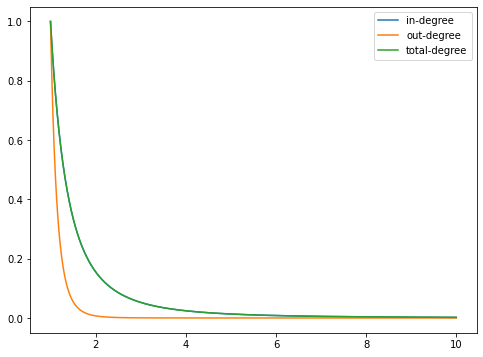

In [23]:
import matplotlib.pyplot as plt

# plot the there line in the same figure
plt.figure(figsize = (8,6))
x=np.linspace(1,10,1000) 
y_in=[np.power(k,-in_alpha) for k in x] 
y_out=[np.power(k,-out_alpha) for k in x] 
y_all=[np.power(k,-all_alpha) for k in x] 
plt.plot(x,y_in,label='in-degree') 
plt.plot(x,y_out,label='out-degree') 
plt.plot(x,y_all,label='total-degree') 
plt.legend()
plt.show() 


We could observe that the chance of high out-degree is decresing much faster than in and total degree, which indicates that it will be hard to see high out-degrees compared with the other ones. 

>> - When analyzing the plots of in- and out- degree distribution last week, did you come up to the same conclusions?

**Answer:**
Yes, comparing this result with the degree distribution we draw last week, it is clear that these two address the same conclusions that the distribution of in-degree is smoother than out-degree.

>> - Some long time ago, couple of scientist have analyzed the network that is spanned by the whole Wikipedia (paper is called Wikipedias: Collaborative web-based encyclopedias as complex networks; to access this paper, use findit.dtu.dk or read the preprint on arXiv). Do your findings correspond to the results described in Chapter III.A? If not, why?

**Answer:**  
Our findings ( $\gamma_{in} = 2.39$, $\gamma_{out} = 6.81$, $\gamma_{all} = 3.92$) are not that similar with this paper ( $\gamma_{in} = 2.15± 0.13$, $\gamma_{out} = 2.57 ± 0.27$, $\gamma_{all} = 2.35 ± 0.17$). The biggest difference is with the out-degree, as ours are larger then 6 and the paper's is around 2.5. This result indicates that in this comics network, the hubs are lack for out-degree. 
One possible reason is that the network we choose is the comics network, which is just a small part compared with the whlole wiki network, thus for each wiki page, lots of links are considered useless if they are not the characters in our defined comics network. Therefore, the number of out-degree is somehow 'strinked' due to the range of the network. The impact of in-degree is small, because most of the links which link back to the characters in comics network, are the comoics characters. Thus the influence is slight for in-degree.

>3. Plot a scatter plot of the the in- versus out- degree for all characters. Comment on the relation between the two.

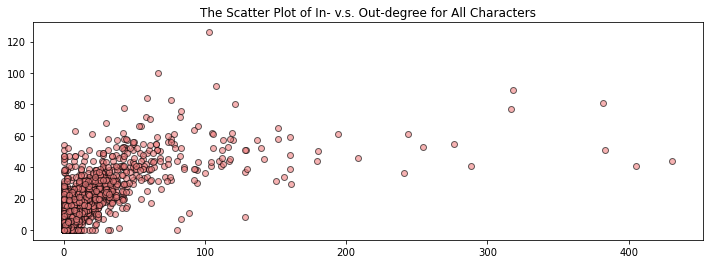

In [24]:
# in_degrees = [d for n,d in G.in_degree()]
# out_degrees = [d for n,d in G.out_degree()]
plt.figure(figsize=(12,4))
plt.scatter(in_degrees,out_degrees,alpha=0.6,color = 'lightcoral',edgecolors='k')
plt.title('The Scatter Plot of In- v.s. Out-degree for All Characters')
plt.show()

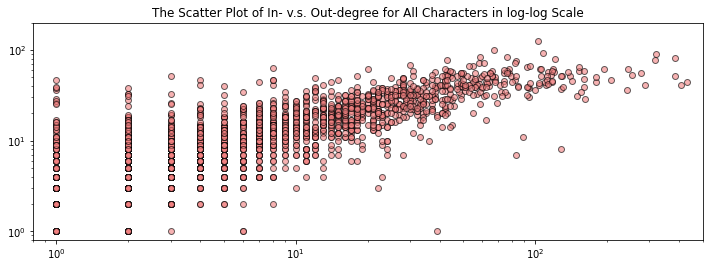

In [25]:

# plot the scatter with log-log scale
plt.figure(figsize=(12,4))

plt.xscale('log') # set the scale to 'log'
plt.yscale('log')
plt.xlim([0.8,500]) # set the range of x axis
plt.ylim([0.8,200]) # set the range of y axis
plt.scatter(in_degrees,out_degrees,alpha=0.6,color = 'lightcoral',edgecolors='k')
plt.title('The Scatter Plot of In- v.s. Out-degree for All Characters in log-log Scale')
plt.show()

> 4. Plot a heatmap (Hint here) of the the in- versus out- degree for all characters. What is the advantage of using a heatmap over the scatter plot?

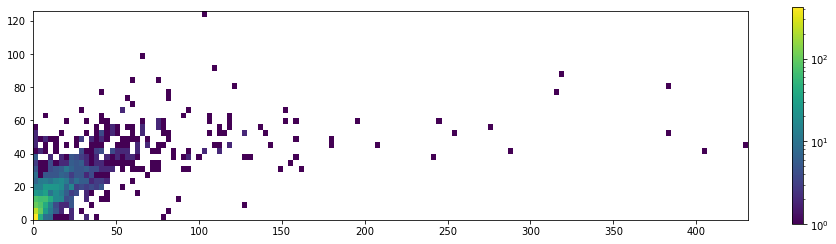

In [26]:
import matplotlib
heatmap, xedges, yedges = np.histogram2d(in_degrees, out_degrees, bins=(140,35))
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

plt.figure(figsize = (16,4))
plt.imshow(heatmap.T, extent=extent, origin='lower',norm = matplotlib.colors.LogNorm())
plt.colorbar()
plt.show()

> What is the advantage of using a heatmap over the scatter plot?

**Answer:**  
In scatter plot, the nodes are easily to overlap with each other, which will avoid us to know the true distribution of the nodes. With heatmap, on the other hand, we could get the distribution by the color and the colorbar. 

> 5. Why do you think I want you guys to use a directed graph? Could have we used an undirected graph instead?

**Answer：**
From my understanding:  
Firstly, this is the real world situation, as in wikipedia, the links are not bidirectional. For each link, the source page and the pointing-toward page has very different meanings.
Secondly, the directions of the edges (or the *‘directed’* information) are important for anslyzing the network.
Thirdly, undirected graph could be seen as a special directed graph. Thus, once we have learned how to deal with the directed ones, the undirected ones should not be difficult.

> 6. We have one more metric that we did not use. The node-attribute content lenght. There are two things we can investigate here.
>> - Firstly, we can verify that more text means more links. If that's true the length should correlate with out-degree.
>> - Secondly, and more interestingly, it could be that longer texts means more famous characters. And that means more in-links.
>> - How should you test this? Well, here you are allowed to be creative. You may choose the method of your liking to study this question (e.g. look at it visually, test the correlation using spearman or pearson, fit a curve to the data, you decide). Once you've tested, let me know. Are both questions true? If yes, which phenomenon is stronger? Explain your results in your own words

**Answer:**  

Firstly, we plot the relationship with the content length and both in and out degree to have a overall understanding of how they correlate with each other.

In [27]:
# plot the out-degree with the content_length

# get the content_length and out_degrees
content_length = [nx.get_node_attributes(G,'len_content')[each] for each in nx.get_node_attributes(G,'len_content')]
out_degrees = [d for n,d in G.out_degree()]

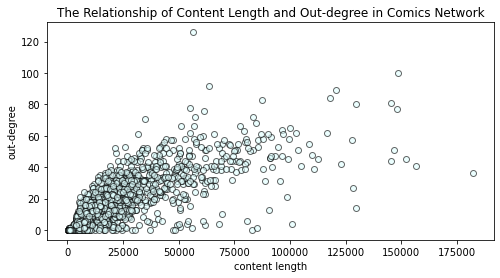

In [28]:
# plot
plt.figure(figsize=(8,4))
plt.scatter(content_length,out_degrees,alpha=0.6,color = 'lightcyan',edgecolors='k')

plt.ylabel('out-degree')
plt.xlabel('content length')
plt.title('The Relationship of Content Length and Out-degree in Comics Network')
plt.show()

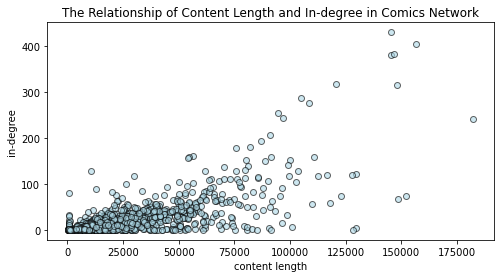

In [29]:
# plot the in-degree with the content_length

# get the content_length and out_degrees
content_length = [nx.get_node_attributes(G,'len_content')[each] for each in nx.get_node_attributes(G,'len_content')]
in_degrees = [d for n,d in G.in_degree()]

# plot
plt.figure(figsize=(8,4))
plt.scatter(content_length,in_degrees,alpha=0.6,color = 'lightblue',edgecolors='k')

plt.ylabel('in-degree')
plt.xlabel('content length')
plt.title('The Relationship of Content Length and In-degree in Comics Network')
plt.show()

Visually speaking, these two degrees are correlated with the content length. To prove our assumption, it is better to calculate the Spearman's rank correlation coefficient. Accoring to [Spearman correlation wiki page](https://en.wikipedia.org/wiki/Spearman%27s_rank_correlation_coefficient), this method use the ranking to calculate the correlation. The value of Spearman correlation is range from -1 to +1, and -1 and +1 indicates the perfect correlation (the same ranking and the opposite ranking respectively). The value of 0 means the data is not correlated with each other. 

In [30]:
# calculate the spearman correalation for these two pairs
from scipy import stats
out_len_spear = stats.spearmanr(content_length, out_degrees)
in_len_spear = stats.spearmanr(content_length, in_degrees)
print('The spearman correlation for in-degree and content length is {}.'.format(in_len_spear[0]))
print('The spearman correlation for out-degree and content length is {}.'.format(out_len_spear[0]))

The spearman correlation for in-degree and content length is 0.6767904331297266.
The spearman correlation for out-degree and content length is 0.8085808018371652.


From the results of spearman correlations, it is reasonable to say that both in-degree and out-degree correlats with content length, as they got 0.69 and 0.81 respectively. But the result also indicates that the correlation with out-degree and content length is much more stronger than the in-degree and content length.

### Exercise 2: Centralities, assortativity and more.

> Earlier, we found the most connected nodes (using degree centrality).
> 
> Now let's dig in and try to understand more about the network using more advanced features.
> 
> Note: Not all of the measures we'll be considering below are defined for directed graphs. Only use the undirected graph when explicitly stated in the exercise. Meanwhile, for this exercise use either the DC or Marvel Network alone (i.e. only a single universe). This it will help you to see the differences).

In [26]:
# use DC_network or Marvel_network
# -> we choose to use the Marvel_network

> 1. Find the 5 most central characters according to degree centrality.   
>> - Repeat Exercise A2 or A3 from above for your new sub-network (depending on which visualization method you liked the most), but with our new network.

***what is degree centrality:***
*Degree centrality is defined as the number of links incident upon a node (i.e., the number of ties that a node has). If the network is directed (meaning that ties have direction), then two separate measures of degree centrality are defined, namely, indegree and outdegree.*

In [31]:
# Find the 5 most central characters according to degree centrality

network_name = 'Marvel_network'
print('Choosen network:{}\n'.format(network_name))

# as the network is direcred network, so there are 2 kinds of degree centrality
in_degree_c = nx.in_degree_centrality(Marvel_network)
out_degree_c = nx.out_degree_centrality(Marvel_network)

# get the first 5 with in degree centrality
in_degree_c_sorted  = sorted(in_degree_c.items(),key = lambda x:x[1],reverse = True)
print('5 most central characters (in degree centrality):\n{}'.format(in_degree_c_sorted[0:5]))
print('\n')

# get the first 5 with out degree centrality
out_degree_c_sorted  = sorted(out_degree_c.items(),key = lambda x:x[1],reverse = True)
print('5 most central characters (out degree centrality):\n{}'.format(out_degree_c_sorted[0:5]))
                             

Choosen network:Marvel_network

5 most central characters (in degree centrality):
[('Spider-Man', 0.3362974939369442), ('Captain_America', 0.2853678253839935), ('Iron_Man', 0.2473726758286176), ('Hulk', 0.22716248989490703), ('Wolverine_(character)', 0.21827000808407437)]


5 most central characters (out degree centrality):
[('Hood_(comics)', 0.10185933710590137), ('Venom_(Marvel_Comics_character)', 0.08003233629749393), ('New_Warriors', 0.07356507679870654), ('Psylocke', 0.06709781729991915), ('Cyclops_(Marvel_Comics)', 0.06143896523848019)]


In [32]:
# define a function for drawing the plot Force-directed graph 

# d = dict(G_undirect.degree)
'''
function plot_force_directed_graph: plot Force-directed graph with given graph and the nodesize info
    params: 
        Graph: the graph
        node_size_dict: the dictionary with the following formt {'<node_name>':<node_size>, ...}
'''
def plot_force_directed_graph(Graph, node_size_dict,fivemost_nodes,title_text):
    from fa2 import ForceAtlas2
    plt.figure(figsize = (30,20))

    forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=0.01, #More makes a more sparse graph
                        strongGravityMode=False,
                        gravity=100.0, # increse this, the nodes will be attracted to the center more

                        # Log
                        verbose=True)

    positions = forceatlas2.forceatlas2_networkx_layout(Graph, pos=None, iterations=500)
    nx.draw_networkx(Graph, positions,nodelist=list(node_size_dict.keys()), node_size=list(node_size_dict.values()), alpha = 0.6,\
                        node_color = '#EA3C0D',edge_color  = '#EE896E',with_labels=False)
    nx.draw_networkx_nodes(Graph, positions, nodelist=list(fivemost_nodes.keys()),node_size=list(fivemost_nodes.values()), \
                           alpha = 0.6, node_color='#EA3C0D',edgecolors ='black')
    labels = {}
    for node in fivemost_nodes.keys():
        labels[node] = node
    nx.draw_networkx_labels(Graph,positions,labels,font_size=18,font_color='k')
    plt.title(title_text,fontsize=28)
    plt.axis('off')
    plt.show()

{'Spider-Man': 3362.974939369442, 'Captain_America': 2853.678253839935, 'Iron_Man': 2473.726758286176, 'Hulk': 2271.6248989490705, 'Wolverine_(character)': 2182.700080840744}


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 17.95it/s]


BarnesHut Approximation  took  3.64  seconds
Repulsion forces  took  22.97  seconds
Gravitational forces  took  0.12  seconds
Attraction forces  took  0.11  seconds
AdjustSpeedAndApplyForces step  took  0.40  seconds


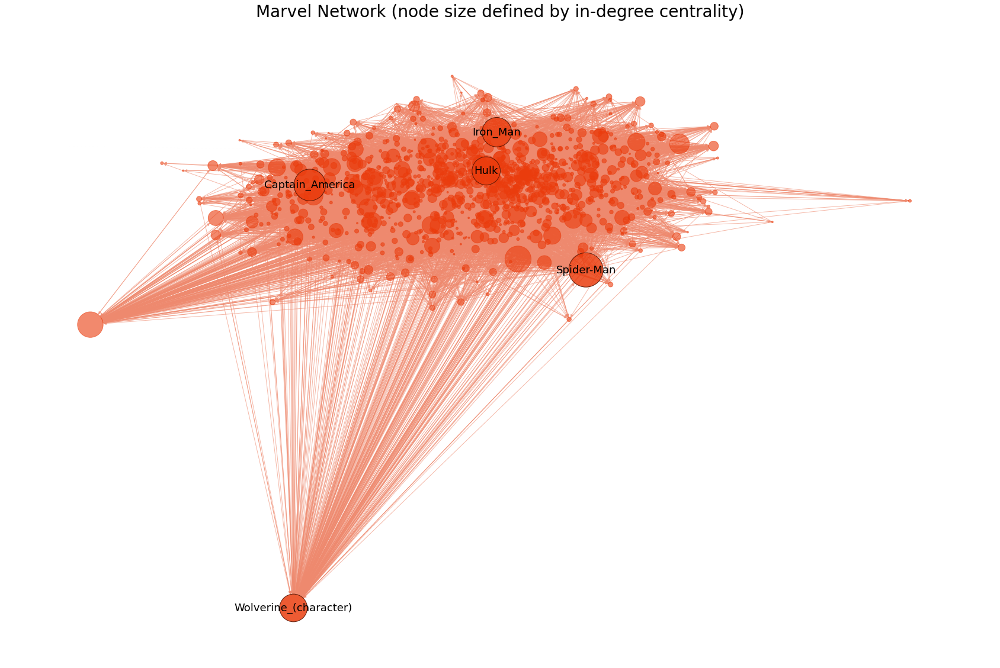

In [33]:
# plot the network with in-degree centrality
in_degree_c_sorted  = sorted(in_degree_c.items(),key = lambda x:x[1],reverse = True)
in_degree_c_sorted = dict(in_degree_c_sorted)
in_degree_c_sorted.update((x, y*10000) for x, y in in_degree_c_sorted.items())

# the 5 central most character
nodes_ = list(in_degree_c_sorted)[0:5]
fivemost_nodes = {}
for n in nodes_:
    fivemost_nodes[n] = in_degree_c_sorted[n]
print(fivemost_nodes)
# title for this plot
title_text = 'Marvel Network (node size defined by in-degree centrality)'

plot_force_directed_graph(Marvel_network, in_degree_c_sorted,fivemost_nodes,title_text)

> 2. Find the 5 most central characters according to betweenness centrality.
>> * Repeat Exercise A2 or A3 (depending on which visualization method you liked the most). However, this time use betweenness centrality to define the size of the node.
>> - What role do you imagine characters with high wikipedia graph betweenness centrality play?

**Betweenness** is a centrality measure of a vertex within a graph. Betweenness centrality *quantifies the number of times a node acts as a bridge along the shortest path between two other nodes.*   
Betweenness is usually used in the undirected graph so here we use the undirected graph.

In [34]:
# undirected marvel network
U_Marvel_network = Marvel_network.to_undirected()

# get the Betweenness centrality
bet_c = nx.betweenness_centrality(U_Marvel_network)

In [35]:
# the 5 most central characters according to betweenness centrality
bet_c_sorted  = sorted(bet_c.items(),key = lambda x:x[1],reverse = True)
print('5 most central characters (betweenness centrality):\n{}'.format(bet_c_sorted[0:5]))
print('\n')

5 most central characters (betweenness centrality):
[('Spider-Man', 0.10146755168038647), ('Captain_America', 0.08429957128694207), ('Iron_Man', 0.05626158617427071), ('Wolverine_(character)', 0.04976244909453098), ('Hulk', 0.047346052372888886)]




In [36]:
# let the value times c for plotting
bet_c_sorted = dict(bet_c_sorted)
bet_c_sorted.update((x, y*100000) for x, y in bet_c.items())

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:30<00:00, 16.44it/s]


BarnesHut Approximation  took  4.17  seconds
Repulsion forces  took  24.73  seconds
Gravitational forces  took  0.10  seconds
Attraction forces  took  0.23  seconds
AdjustSpeedAndApplyForces step  took  0.42  seconds


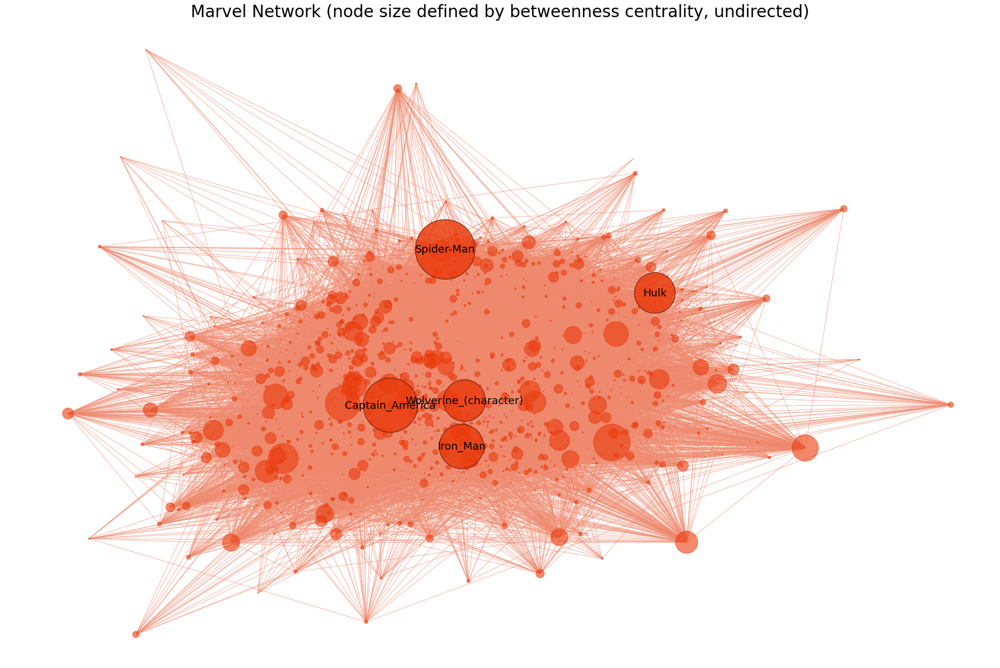

In [37]:
# the 5 central most character
nodes_ = list(bet_c_sorted)[0:5]
fivemost_nodes = {}
for n in nodes_:
    fivemost_nodes[n] = bet_c_sorted[n]

plot_force_directed_graph(U_Marvel_network, bet_c_sorted,fivemost_nodes,\
                          'Marvel Network (node size defined by betweenness centrality, undirected)')

> - What role do you imagine characters with high wikipedia graph betweenness centrality play?

**Answer:**  
In my understanding, those characters with high wikipedia graph betweenness centrality should the characters who plays as the 'hub' in the relationships,through who other characters whould be easy to have connections with each other.  
We could see from the result that the 5 most central characters according to betweenness centrality are extacly the same with the in-degree, if we print the 10 most, there's still a high rate of overlapping. That probably because in the comics world, those ones has high degree are the main characters of comics book, so these people would have more connections to other characters which make them eaiser to have high betweenness centrality.

> 3. Find the 5 most central characters according to eigenvector centrality. Calculate centrality corresponding to both in- and out-edges (see NetworkX documentation for details).
>> - Repeat Exercise A2 or A3 (depending on which visualization method you liked the most). However, this time use eigenvector centrality to define the size of the node.
>> - What role do you imagine characters with high wikipedia graph eigenvector centrality play?

**eigenvector centrality**:
In graph theory, eigenvector centrality is a measure of the influence of a node in a network. Relative scores are assigned to all nodes in the network based on the concept that *connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes*. A high eigenvector score means that a node is connected to many nodes who themselves have high scores.

In [38]:
# calculate eigenvector centrality for both in- and out-edges

# in-degree edges
in_eigen_c = nx.eigenvector_centrality(Marvel_network)

# out-degree edges
# according to document : For directed graphs this is “left” eigenvector centrality which corresponds to the in-edges in the graph. 
# For out-edges eigenvector centrality first reverse the graph with G.reverse().
out_eigen_c = nx.eigenvector_centrality(Marvel_network.reverse())

# sort both eigenvector centrality
in_eigen_c = sorted(in_eigen_c.items(),key = lambda x:x[1],reverse = True)
out_eigen_c = sorted(out_eigen_c.items(),key = lambda x:x[1],reverse = True)

# get the 5 most central characters according to eigenvector centrality
print('5 most central characters (eigenvector centrality corresponding to in- edges):\n{}'.format(in_eigen_c[0:5]))
print('5 most central characters (eigenvector centrality corresponding to out- edges):\n{}'.format(out_eigen_c[0:5]))

5 most central characters (eigenvector centrality corresponding to in- edges):
[('Spider-Man', 0.25078797485314464), ('Iron_Man', 0.2267685845911671), ('Hulk', 0.22516303773196333), ('Captain_America', 0.22341067317090435), ('Wolverine_(character)', 0.21082565488961114)]
5 most central characters (eigenvector centrality corresponding to out- edges):
[('Hood_(comics)', 0.13189278818008476), ('Venom_(Marvel_Comics_character)', 0.127483506472236), ('Psylocke', 0.11395881381655501), ('Cyclops_(Marvel_Comics)', 0.1062174822402636), ('Sabretooth_(comics)', 0.10391747251231793)]


100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:33<00:00, 14.75it/s]


BarnesHut Approximation  took  4.35  seconds
Repulsion forces  took  27.90  seconds
Gravitational forces  took  0.14  seconds
Attraction forces  took  0.16  seconds
AdjustSpeedAndApplyForces step  took  0.46  seconds


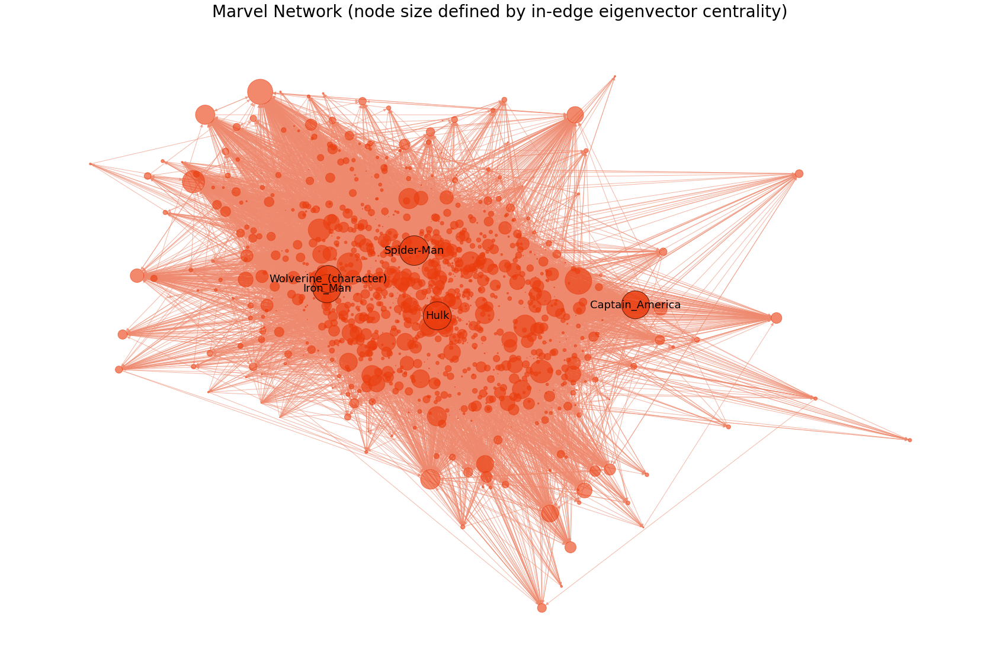

In [39]:
in_eigen_c_plot = dict(in_eigen_c)
in_eigen_c_plot.update((x, y*10000) for x, y in in_eigen_c_plot.items())

nodes_ = list(in_eigen_c_plot)[0:5]
fivemost_nodes = {}
for n in nodes_:
    fivemost_nodes[n] = in_eigen_c_plot[n]
    
plot_force_directed_graph(Marvel_network, in_eigen_c_plot,fivemost_nodes,\
                          'Marvel Network (node size defined by in-edge eigenvector centrality)')

100%|████████████████████████████████████████████████████████████████████████████████| 500/500 [00:27<00:00, 18.32it/s]


BarnesHut Approximation  took  4.16  seconds
Repulsion forces  took  21.99  seconds
Gravitational forces  took  0.10  seconds
Attraction forces  took  0.10  seconds
AdjustSpeedAndApplyForces step  took  0.39  seconds


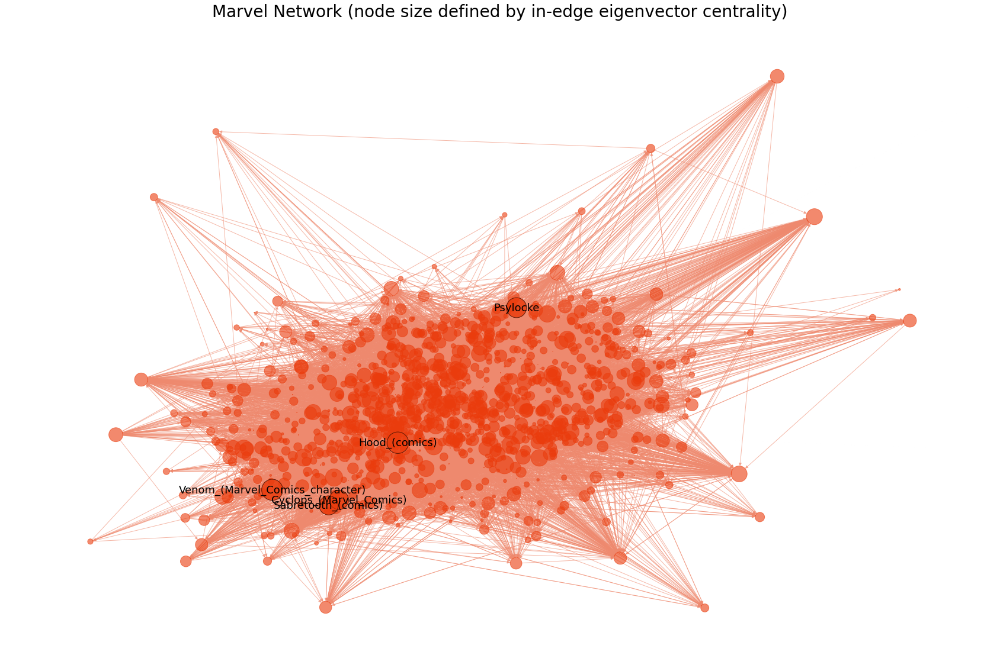

In [40]:
out_eigen_c_plot = dict(out_eigen_c)
out_eigen_c_plot.update((x, y*10000) for x, y in out_eigen_c_plot.items())

nodes_ = list(out_eigen_c_plot)[0:5]
fivemost_nodes = {}
for n in nodes_:
    fivemost_nodes[n] = out_eigen_c_plot[n]

plot_force_directed_graph(Marvel_network, out_eigen_c_plot,fivemost_nodes,\
                          'Marvel Network (node size defined by in-edge eigenvector centrality)')

> What role do you imagine characters with high wikipedia graph eigenvector centrality play?

**Answer:**
As eigenvector centrality indicates the nodes which do not own a high degree but also their neighboors have high degree, I imagine the nodes with high wikipedia graph eigenvector centrality would not only be the main characters of the stories, but those who do not play an important role but however connected with main characters with high rate.

> 4. Plot the betweenness centrality of nodes vs their degree centrality. Is there a correlation between the two? Did you expect that? Why?
>> - Repeat using eigenvector centrality instead of betweenness centrality. Do you observe any difference relative to above? Why?

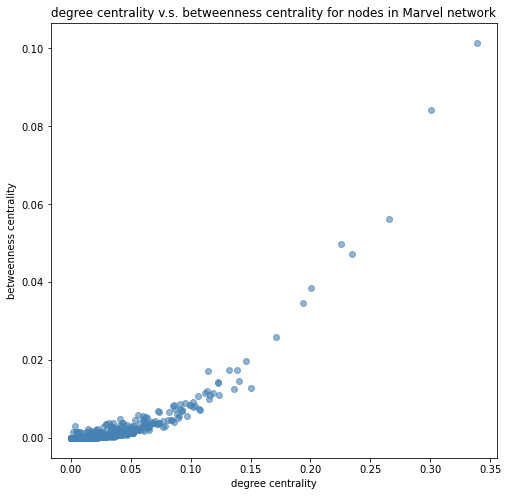

In [46]:
# here maybe we should use the undirected graph as for betweenness_centrality there is no calculation for directed one.
bet_c = nx.betweenness_centrality(U_Marvel_network)
degree_c = nx.degree_centrality(U_Marvel_network)

bet_c_l = list(bet_c.values())
degree_c_l = list(degree_c.values())

# plot
plt.figure(figsize=(8,8))
plt.scatter(degree_c_l,bet_c_l,c = 'steelblue',alpha = 0.6)
plt.title('degree centrality v.s. betweenness centrality for nodes in Marvel network')
plt.ylabel('betweenness centrality')
plt.xlabel('degree centrality')
plt.show()


>  Is there a correlation between the two? Did you expect that? Why?

**Answer:**
Yes, from theplot above, it is clear that there is a correlation between these two. The higher in degree centrality, the higher in betweenness centrality. Instead of linear correlation, it could be observed that the relationship is more like the exponential correlation.  
That is the result that I expect. That is because, betweenness centrality quantifies the number of times a node acts as a bridge along the shortest path between two other nodes, and in comics book, it is reasonable that the main characters (who is high in degree centrality) would be that kind of hub in other nodes shortest path. 

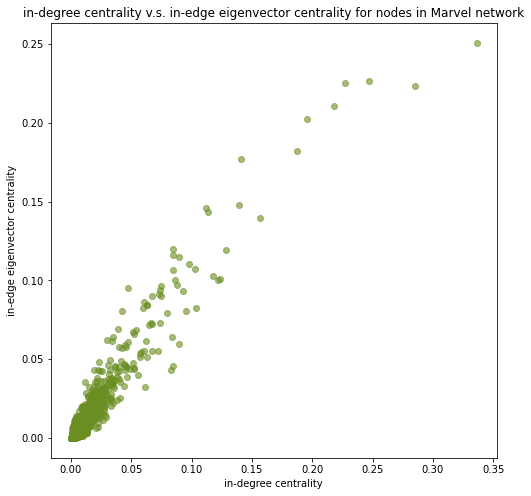

In [47]:
# Repeat using eigenvector centrality instead of betweenness centrality. Do you observe any difference relative to above? Why?

# Do the same thing with degree centrality v.s. eigenvector centrality 
# and we will plot the in- and out- respectively
in_eigen_c = nx.eigenvector_centrality(Marvel_network)
in_degree_c = nx.in_degree_centrality(Marvel_network)

in_eigen_c_l = list(in_eigen_c.values())
in_degree_c_l = list(in_degree_c.values())

# plot
plt.figure(figsize=(8,8))
plt.scatter(in_degree_c_l,in_eigen_c_l,c = 'olivedrab',alpha = 0.6)
plt.title('in-degree centrality v.s. in-edge eigenvector centrality for nodes in Marvel network')
plt.ylabel('in-edge eigenvector centrality')
plt.xlabel('in-degree centrality')
plt.show()


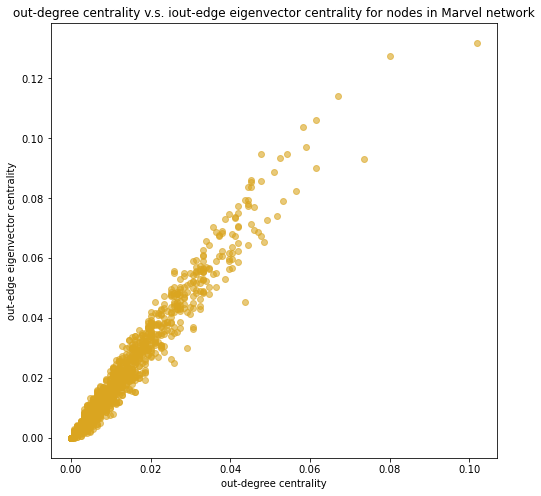

In [48]:
# out- degree and out-edge eigenvector centrality
out_eigen_c = nx.eigenvector_centrality(Marvel_network.reverse())
out_degree_c = nx.out_degree_centrality(Marvel_network)

out_eigen_c_l = list(out_eigen_c.values())
out_degree_c_l = list(out_degree_c.values())

# plot
plt.figure(figsize=(8,8))
plt.scatter(out_degree_c_l,out_eigen_c_l,c = 'goldenrod',alpha = 0.6)
plt.title('out-degree centrality v.s. iout-edge eigenvector centrality for nodes in Marvel network')
plt.ylabel('out-edge eigenvector centrality')
plt.xlabel('out-degree centrality')
plt.show()

> Repeat using eigenvector centrality instead of betweenness centrality. Do you observe any difference relative to above? Why?

**Answer:**
The relationship between eigenvector centrality and degree centrality is much more linear than the betweenness centrality. And the trends are quite similar in both in- and out- degree/edges. 
(how to answer this way =.=)

> 5. Is the undirected version of the graph assortative with respect to degree? (e.g. do high-degree characters tend to link to other high-degree characters, and low-degree characters to other low-degree characters?). Provide an interpretation of your answer.

**Answer:**  
In order to check that, we could calculate the average neighbour's degree, and plot that with the node's degree.

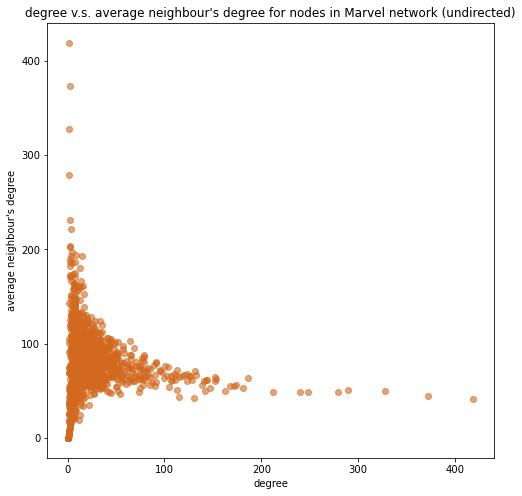

In [49]:
# undirected marvel network
U_Marvel_network = Marvel_network.to_undirected()
avg_nei_degrees = nx.average_neighbor_degree(U_Marvel_network)

# plot
plt.figure(figsize=(8,8))
plt.scatter(dict(U_Marvel_network.degree()).values(),avg_nei_degrees.values(),c= 'chocolate',alpha=0.6)
plt.title('degree v.s. average neighbour\'s degree for nodes in Marvel network (undirected)')
plt.xlabel('degree')
plt.ylabel('average neighbour\'s degree')
plt.show()

Oops, that's cute really.

That's use another way to see this question. For every link, that's find out the 2 nodes' degree and draw it on the plot. And observe what we will get.


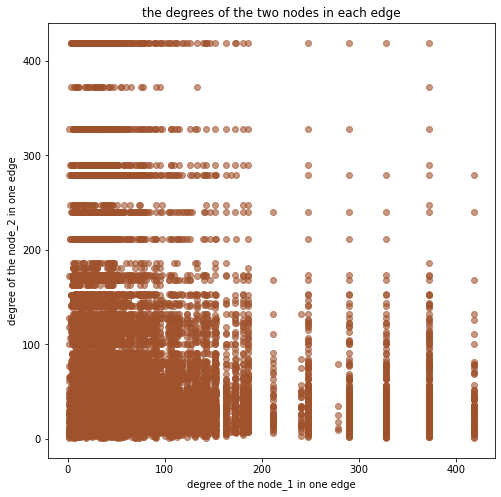

In [50]:
x = []
y = []
for e in U_Marvel_network.edges():
    node_1 = e[0]
    node_2 = e[1]
    x.append(U_Marvel_network.degree(node_1))
    y.append(U_Marvel_network.degree(node_2))

# plot
plt.figure(figsize=(8,8))
plt.scatter(x,y,c= 'sienna',alpha=0.6)
plt.title('the degrees of the two nodes in each edge')
plt.xlabel('degree of the node_1 in one edge')
plt.ylabel('degree of the node_2 in one edge')
plt.show()

We could know from these two plots that, this saying *'high-degree characters tend to link to other high-degree characters, and low-degree characters to other low-degree characters'* is not correct. It seems that the high-degree characters tend to link low-degree characters.

> 6. Is the undirected version of the graph assortative with respect do the content length nodal properties? (e.g. do characters with long Wikipedia pages tend to link to other charakters with long Wiki-pages, and vice versa?. Hint: Use this function. Provide an interpretation of your answer.

As the document describes, *assortativity measures the similarity of connections in the graph with respect to the given attribute.* So we could use this function to see the similarity of connections of content length in our network. 

In [51]:
len_content_ass = nx.attribute_assortativity_coefficient(U_Marvel_network,'len_content')
print('the similarity of connections in the graph with respect to the given attribute:{} is {:.5f}.'.format('content length',len_content_ass))

the similarity of connections in the graph with respect to the given attribute:content length is -0.00211.


We could see that the similarity is very close to zero, which mean that there is actually no similarity of connections of the attribute 'content length'. We could also address this conclusion according to the following plot.

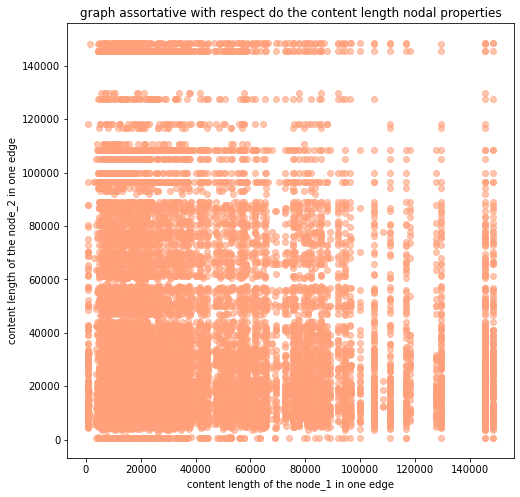

In [52]:
x = []
y = []
for e in U_Marvel_network.edges():
    node_1 = e[0]
    node_2 = e[1]
    x.append(nx.get_node_attributes(U_Marvel_network,'len_content')[node_1])
    y.append(nx.get_node_attributes(U_Marvel_network,'len_content')[node_2])

# plot
plt.figure(figsize=(8,8))
plt.scatter(x,y,c= 'lightsalmon',alpha=0.6)
plt.title('graph assortative with respect do the content length nodal properties')
plt.xlabel('content length of the node_1 in one edge')
plt.ylabel('content length of the node_2 in one edge')
plt.show()

> 7. What is the average shortest path length? Is it similar to the one of a random graph with the same number of nodes N and probablity of connection p?
>> - Take a look at the distribution of shortest paths for the two networks (create a histogram for each network) to better compare and contrast. Explain what you see in your own words.

In [53]:
# need to get the largest weakly connected conponent
largest_cc = max(nx.weakly_connected_components(Marvel_network), key=len)

Marvel_largest_cc = Marvel_network.subgraph(largest_cc)

# calculate the average shortest path length
avg_short_path_len = nx.average_shortest_path_length(Marvel_largest_cc)
print('the average shortest path length is {}'.format(avg_short_path_len))

the average shortest path length is 2.5730934865550252


In [54]:
# get the node number N and probablity of connection p
N = len(Marvel_largest_cc.nodes())
p = len(Marvel_largest_cc.edges())/(N*(N-1))
print('N:{}\tp:{:.4f}'.format(N,p))

# generate a random graph with the same N and p
G_random = nx.erdos_renyi_graph(N, p, seed = 2020,directed = True)
# calculate the average shortest path length
avg_short_path_len_random = nx.average_shortest_path_length(G_random)
print('the average shortest path length is {}'.format(avg_short_path_len_random))

N:1184	p:0.0138
the average shortest path length is 2.807936476205707


In [55]:
# get the length of shortest path for marvel network
shortest_m = dict(nx.shortest_path_length(Marvel_largest_cc))
s_m_list = []
for each in shortest_m:
    tmp_dict = shortest_m[each]
    for e in tmp_dict:
        s_m_list.append(tmp_dict[e])

0 7


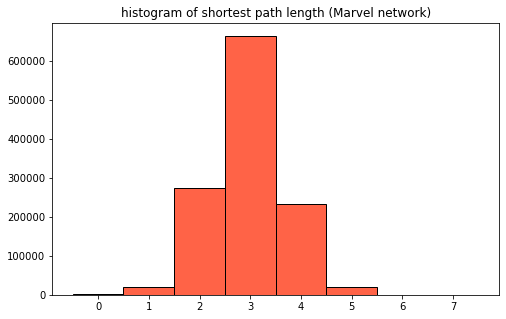

In [56]:
# histogram
min_, max_ = min(s_m_list),max(s_m_list)
print(min_,max_)

plt.figure(figsize=(8,5))
plt.hist(s_m_list,bins =np.arange(min_,max_+2) ,color = 'tomato',edgecolor='k',align ='left')
plt.title('histogram of shortest path length (Marvel network)')
plt.show()

0 4


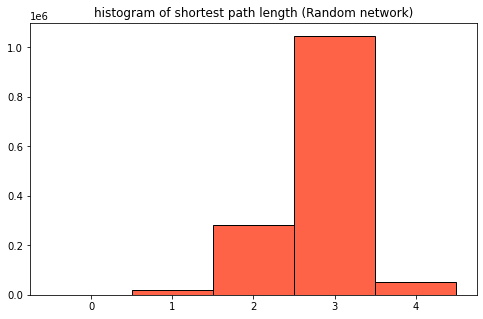

In [57]:
# get the length of shortest path for random network
shortest_m = dict(nx.shortest_path_length(G_random))
s_m_list = []
for each in shortest_m:
    tmp_dict = shortest_m[each]
    for e in tmp_dict:
        s_m_list.append(tmp_dict[e])
        
# histogram
min_, max_ = min(s_m_list),max(s_m_list)
print(min_,max_)

plt.figure(figsize=(8,5))
plt.hist(s_m_list,bins =np.arange(min_,max_+2) ,color = 'tomato',edgecolor='k',align ='left')
plt.title('histogram of shortest path length (Random network)')
plt.show()


> Explain what you see in your own words.

**Answer:**

Do not feel like answer this right now.


> Optional (but cool). What about betweenness centrality in the full network? Create a visualization of the network using Force Atlas 2, where you set the size of nodes to scale according to their betweenness centrality. Describe in your own words what you learn from that plot.

**Answer:**  
Have done that. Wait a minute, what does the exercise mean in B-E2-2?? Does that instruct us to do the same thing?

What you learn from that plot: actually do not know how to answer that...


### Exercise 3: Does a universe of a character play a large role? Now, let us explore if and how they shape the network (use full network).
> 1. Compute the average node centrality for Marvel and DC characters respectively (choose your favourite centrality measure). Which universe has the more central characters?

*Question:* how to define which universe has the more central characters, just by the average node centrality?  
Also, is here the average node centrality should be calculated in the full network?

In [58]:
# calculate the average node centrality of this two networks(using betweenness centrality)
import numpy as np
from operator import itemgetter
bet_c = nx.betweenness_centrality(G)
def avg_bet_centrality(bet_c,dc_cha,marvel_cha):
    dc_mean =  np.mean(itemgetter(*dc_cha)(bet_c) )
    marvel_mean =  np.mean(itemgetter(*marvel_cha)(bet_c) )
    return (marvel_mean,dc_mean)

In [59]:
marvel_avg_bet_c_real,dc_avg_bet_c_real = avg_bet_centrality(bet_c,dc_cha,marvel_cha)
# = avg_bet_centrality(Marvel_network)
# dc_avg_bet_c = avg_bet_centrality(DC_network)
print('The average betweenness centrality of Marvel network is {}.\nThe average betweenness centrality of DC network is {}.'.format(marvel_avg_bet_c_real,\
                                                                                                                                   dc_avg_bet_c_real))

The average betweenness centrality of Marvel network is 0.0008169288443057979.
The average betweenness centrality of DC network is 0.0007450500939222377.


**Answer:**
The result shows that Marvel universe has the more central characters, as DC universe has the average betweenness centrality of 0.000815, while marvel owns 0.000898.

> 2. Create a randomized version of the full graph, where the association between nodes and universes is shuffled. Compute the average centrality of DC and Marvel nodes for this randomized graph.
>> **Hint**: To create this shuffling, simply give everyone a random universe assignment (but with the same number of Marvel and DC characters as in the real data). The way I usually create random lables is by using either random.shuffle or numpy.random.permutation.

In [60]:
import random
# get the node list of G
node_list = list(G.nodes()) 
# shuffle the nodes' names
random.shuffle(node_list)
# create the label mapping
node_mapping = dict(zip(G.nodes(),node_list))
# build a new graph
G_new = nx.relabel_nodes(G, node_mapping)

In [61]:
bet_c_new = nx.betweenness_centrality(G_new)
marvel_avg_bet_c,dc_avg_bet_c = avg_bet_centrality(bet_c_new,dc_cha,marvel_cha)
print('RANDOM VERSION of the full network.\nThe average betweenness centrality of Marvel network is {}.\nThe average betweenness centrality of DC network is {}.'.format(marvel_avg_bet_c,\
                                                                 dc_avg_bet_c))

RANDOM VERSION of the full network.
The average betweenness centrality of Marvel network is 0.0007628570376549496.
The average betweenness centrality of DC network is 0.0008094782908748366.


> 3. Repeat the shuffling process above 1000 times (at least) and plot two histograms, each histogram with the 1000 corresponding average values of centrality obtained for Marvel and DC characters in the shuffeled netowrks.

In [62]:
node_list = list(G.nodes()) 
bet_c = nx.betweenness_centrality(G)

def avg_betc_shuffle():
    random.shuffle(node_list)
    node_mapping = dict(zip(G.nodes(),node_list))
    
    # constructing a new graph is time consuming, so here using the mapping information to calculate the betweenness_centrality

    # get the mapping of the orignal dc/marvel list, the return list is the nodelist which contains the node's original name in original gragh
    dc_list_map = itemgetter(*dc_cha)(node_mapping)
    marvel_list_map = itemgetter(*marvel_cha)(node_mapping)
    
    marvel_avg_bet_c,dc_avg_bet_c = avg_bet_centrality(bet_c_new,dc_list_map,marvel_list_map)
    return (marvel_avg_bet_c,dc_avg_bet_c)


from tqdm import tqdm
avg_bet_c_marvel_list = []
avg_bet_c_dc_list = []
times = 1000
for i in tqdm(range(times)):
    marvel_c, dc_c = avg_betc_shuffle()
    avg_bet_c_marvel_list.append(marvel_c)
    avg_bet_c_dc_list.append(dc_c)

    

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 234.52it/s]


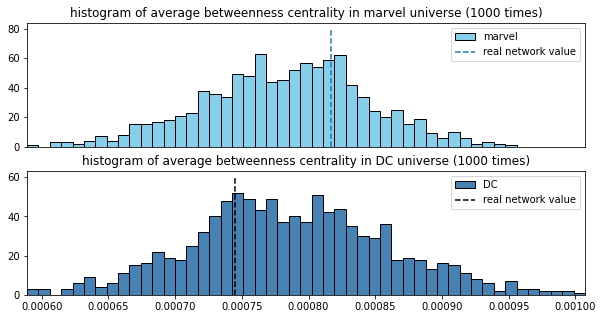

In [68]:
import matplotlib.pyplot as plt
# plot
min_ = min(min(avg_bet_c_marvel_list),min(avg_bet_c_dc_list))
max_ = max(max(avg_bet_c_marvel_list),max(avg_bet_c_dc_list))
xlim_range = [min_,max_]
bins  = np.linspace(min_, max_, num=50)
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(211) 
ax1.hist(avg_bet_c_marvel_list,bins=bins,color = 'skyblue',edgecolor = 'k',label='marvel')
ax1.vlines(marvel_avg_bet_c_real, 0, 80,linestyles ='dashed',label='real network value')
ax1.set_title('histogram of average betweenness centrality in marvel universe (1000 times)')
ax1.set_xlim(xlim_range)
ax1.set_xticks([])
ax1.legend()

ax2 = fig.add_subplot(212) 
ax2.hist(avg_bet_c_dc_list,bins = bins,color = 'steelblue',edgecolor = 'k',label = 'DC')
ax2.vlines(dc_avg_bet_c_real, 0, 60,linestyles ='dashed',color = 'k',label='real network value')
ax2.set_title('histogram of average betweenness centrality in DC universe (1000 times)')
ax2.set_xlim(xlim_range)
ax2.legend()
plt.show()

> 4. Compare the value you have obtained in the real graph, with the randomized cases. Are characters of one of the two universes more central in the network (on average)?

**Answer:**
Yes, it is obvious that the characters in marvel universe are much more central in the nwtwork compared with the randomized cases.


> 5. Think about your results, what could be possible explanations for what you observe?

**Answer:**  
分析不出来//marvel的故事交集更多？DC的更独立？no idea 玛德都是什么问题呐